### Example:

- How to read and extract JSON data for one location only:

<code> device_id = '5100' </code>


In [ ]:
import os
import pandas as pd
#import json
#import geopandas as gpd
#import folium
#import contextily

path_data = r'C:\Users\sotarolabustos\Documents\Hazen\Projects\UVA Data\UVA_Link_Lab_Sensor_Data'
metadata_sheet = os.path.join(path_data,'sensor_location_metadata.xlsx')
df_meta = pd.read_excel(metadata_sheet)
dlpr6_data = os.path.join(path_data, 'bq-results-20250520-dlpr26.json')
dlmbx_data = os.path.join(path_data, 'bq-results-20250520-dlmbx.json')

df_dlpr6 = pd.read_json(dlpr6_data, encoding='latin-1', lines=True)
# Expand the 'decoded_payload' column into a DataFrame
payload_df = pd.json_normalize(df_dlpr6['decoded_payload'])
# Concatenate the 'received_at' column with the expanded payload
df_expanded = pd.concat([df_dlpr6['received_at'], payload_df], axis=1)

# Filter for device_id 5100 (as a string, since your sample shows it quoted)
df_5100 = df_expanded[df_expanded['device_id'] == '5100']
#df_5100.head()

- 1. Code to Read all 'DPLR-6' data and save spreadsheet with all available data with one sheet per 'device_id'

In [ ]:
import os
import pandas as pd

path_data = r'C:\Users\sotarolabustos\Documents\Hazen\Projects\UVA Data\UVA_Link_Lab_Sensor_Data'
metadata_sheet = os.path.join(path_data, 'sensor_location_metadata.xlsx')
df_meta = pd.read_excel(metadata_sheet)
dlpr6_data = os.path.join(path_data, 'bq-results-20250520-dlpr26.json')

df_dlpr6 = pd.read_json(dlpr6_data, encoding='latin-1', lines=True)
payload_df = pd.json_normalize(df_dlpr6['decoded_payload'])
df_expanded = pd.concat([df_dlpr6['received_at'], payload_df], axis=1)

# Get Device IDs for DL-PR26 model
dlpr26_ids = df_meta.loc[df_meta['Sensor Model'] == 'DL-PR26', 'Device ID'].astype(str).unique()

excel_path = os.path.join(path_data, 'DLPR26_timeseries_by_device.xlsx')
with pd.ExcelWriter(excel_path) as writer:
    for device_id in dlpr26_ids:
        df_device = df_expanded[df_expanded['device_id'] == device_id].copy()
        # Remove timezone info from 'received_at'
        df_device['received_at'] = pd.to_datetime(df_device['received_at']).dt.tz_localize(None)
        df_device = df_device.sort_values('received_at')
        df_device.to_excel(writer, sheet_name=str(device_id), index=False)

- 2. Code to Read all 'DL-MBX' data and save spreadsheet with all available data with one sheet per 'device_id'

In [ ]:
import os
import pandas as pd

path_data = r'C:\Users\sotarolabustos\Documents\Hazen\Projects\UVA Data\UVA_Link_Lab_Sensor_Data'
metadata_sheet = os.path.join(path_data, 'sensor_location_metadata.xlsx')
df_meta = pd.read_excel(metadata_sheet)
dlmbx_data = os.path.join(path_data, 'bq-results-20250520-dlmbx.json')

df_dlmbx = pd.read_json(dlmbx_data, encoding='latin-1', lines=True)
payload_df = pd.json_normalize(df_dlmbx['decoded_payload'])
df_expanded = pd.concat([df_dlmbx['received_at'], payload_df], axis=1)
# strip whitespaces
df_meta['Sensor Model'] = df_meta['Sensor Model'].str.strip()
# Get Device IDs for DL-MBX model
dlmbx_ids = df_meta.loc[df_meta['Sensor Model'] == 'DL-MBX', 'Device ID'].astype(str).unique()
excel_path = os.path.join(path_data, 'DLMBX_timeseries_by_device.xlsx')

with pd.ExcelWriter(excel_path) as writer:
    for device_id in dlmbx_ids:
        df_device = df_expanded[df_expanded['device_id'] == device_id].copy()
        if df_device.empty:
            continue  # Skip writing empty sheets
        df_device['received_at'] = pd.to_datetime(df_device['received_at']).dt.tz_localize(None)
        df_device = df_device.sort_values('received_at')
        df_device.to_excel(writer, sheet_name=str(device_id), index=False)


- Visualize 'dplr6' data

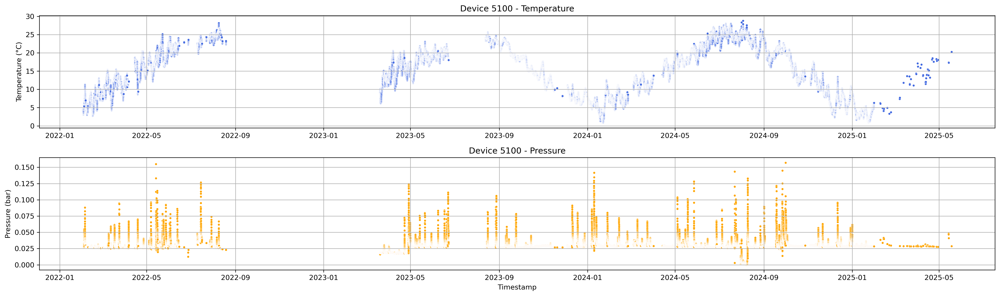

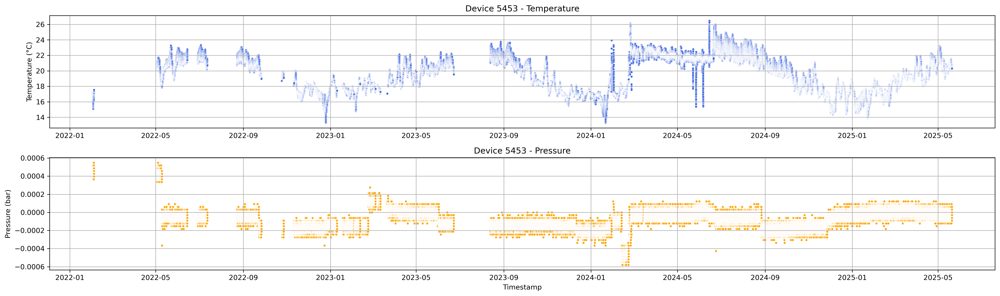

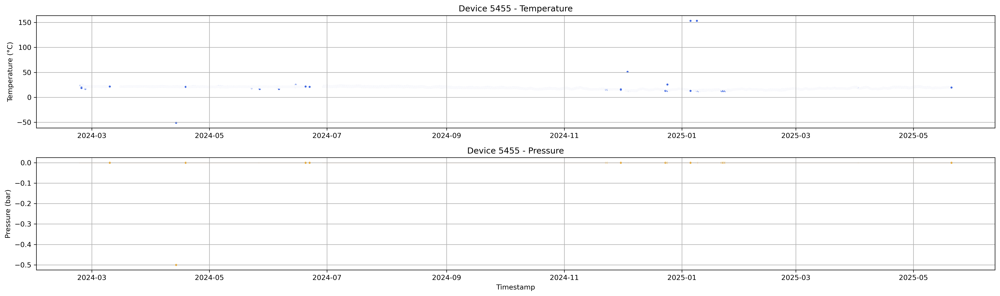

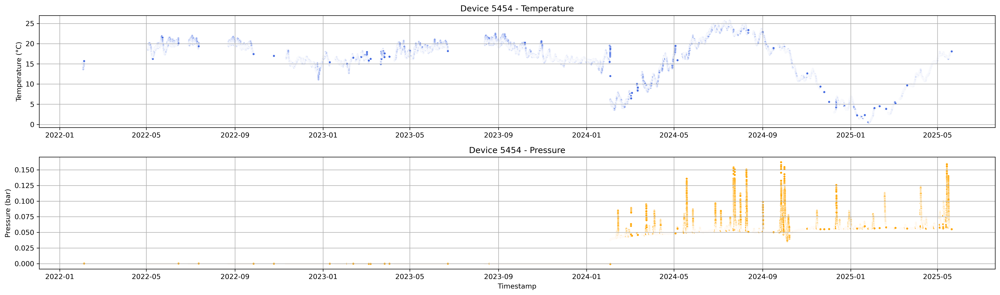

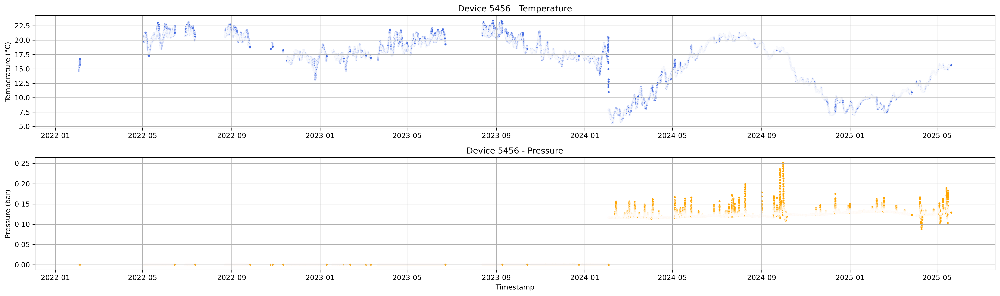

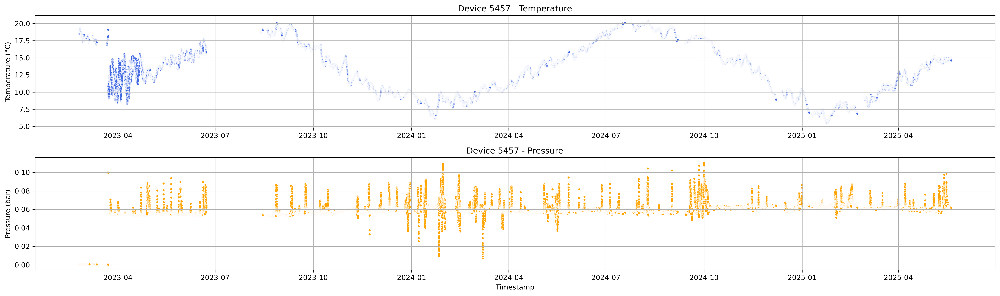

In [39]:
import os
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

path_data = r'C:\Users\sotarolabustos\Documents\Hazen\Projects\UVA Data\UVA_Link_Lab_Sensor_Data'
excel_path = os.path.join(path_data, 'DLPR26_timeseries_by_device.xlsx')
path_output = r'C:\Users\sotarolabustos\Documents\Hazen\Projects\UVA Data\UVA_Link_Lab_Sensor_Data\figures'
# Read all sheet names (device_ids)
xls = pd.ExcelFile(excel_path)
device_ids = xls.sheet_names

for device_id in device_ids:
    df = pd.read_excel(excel_path, sheet_name=device_id)
    # Ensure datetime
    df['received_at'] = pd.to_datetime(df['received_at'])
    plt.figure(figsize=(20, 6), dpi=300)
    
   # Temperature subplot
    plt.subplot(2, 1, 1)
    sns.scatterplot(data=df, x='received_at', y='temperature.value', color='royalblue', s=10)
    plt.title(f'Device {device_id} - Temperature')
    plt.ylabel('Temperature (°C)')
    plt.xlabel('')
    plt.grid(True)
    
    # Pressure subplot
    plt.subplot(2, 1, 2)
    sns.scatterplot(data=df, x='received_at', y='pressure.value', color='orange', s=10)
    plt.title(f'Device {device_id} - Pressure')
    plt.ylabel('Pressure (bar)')
    plt.xlabel('Timestamp')
    plt.grid(True)

    plt.tight_layout()
    # Save figure
    plt.savefig(os.path.join(path_output, f'DLPR26_{device_id}_timeseries.png'), dpi=300)
    plt.show()

- Visualize 'DLMBX' data

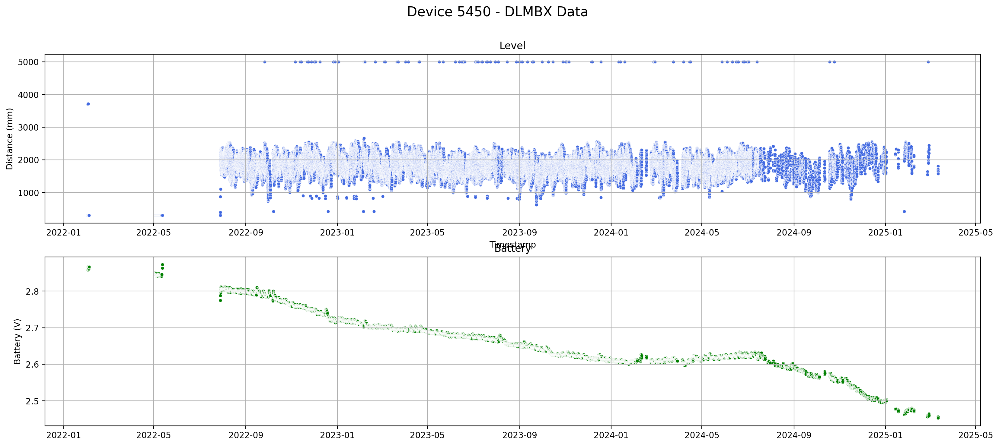

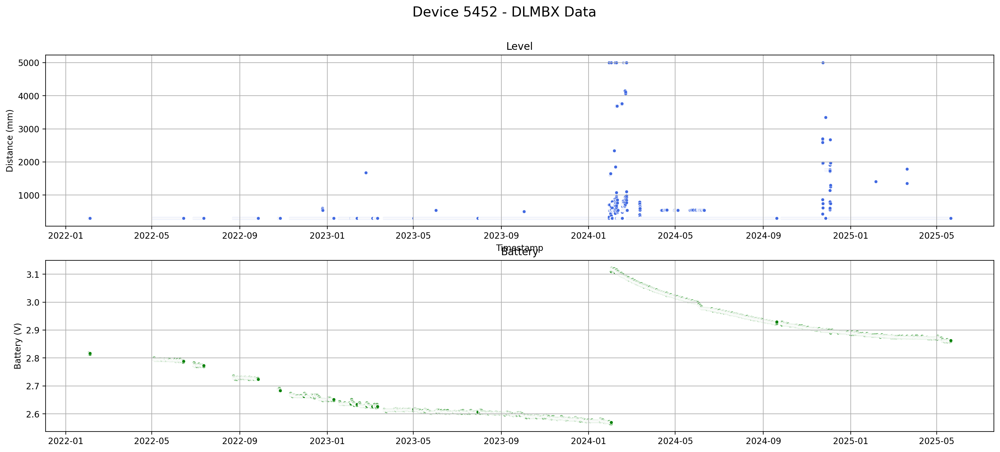

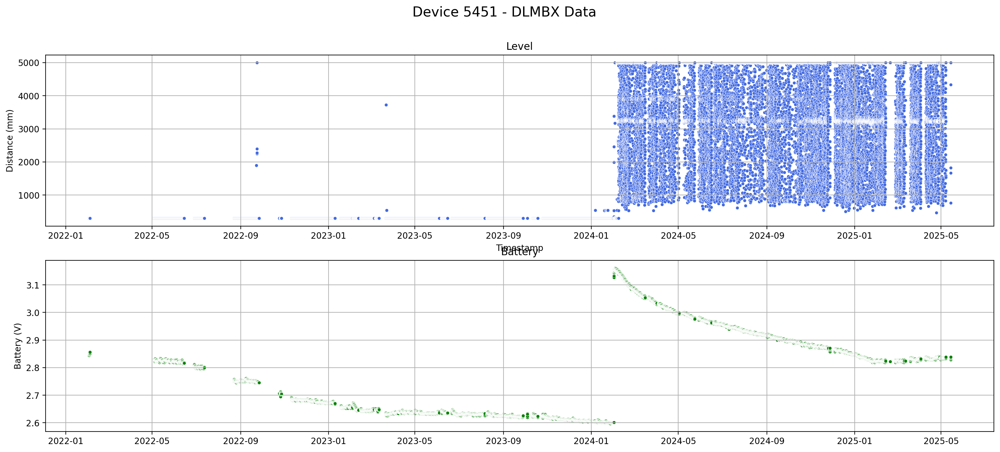

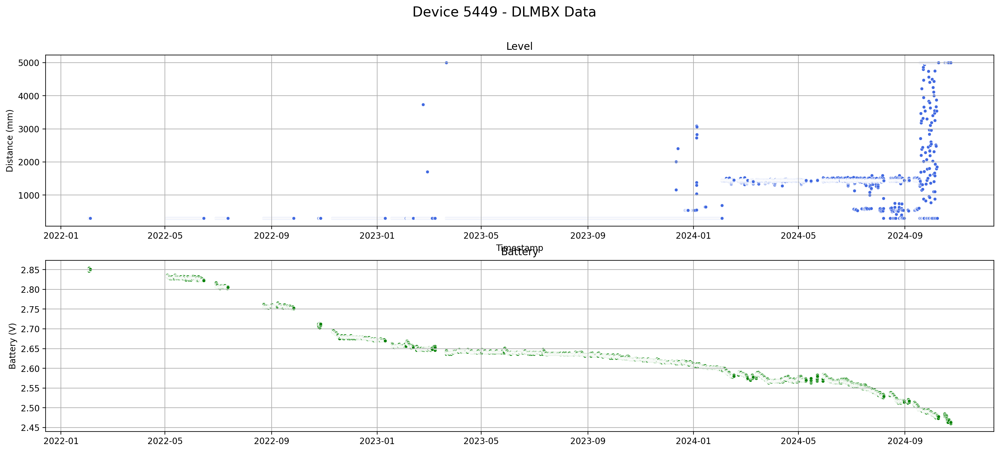

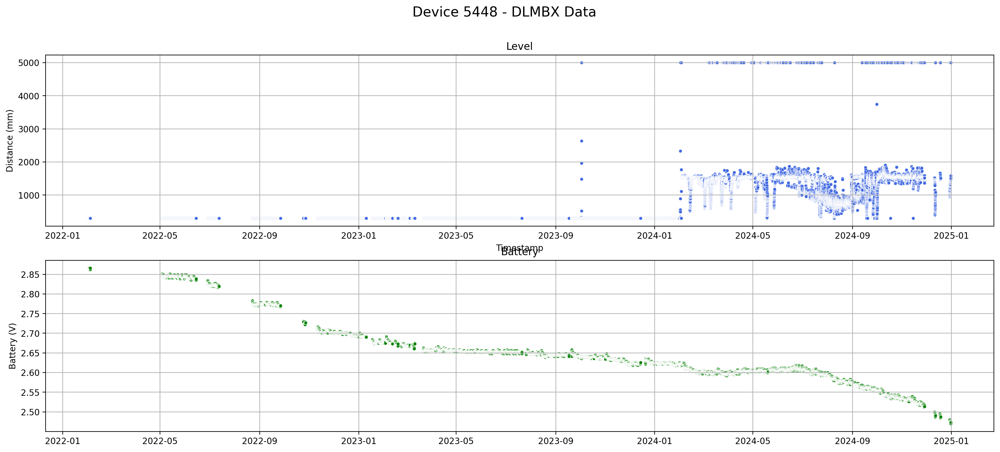

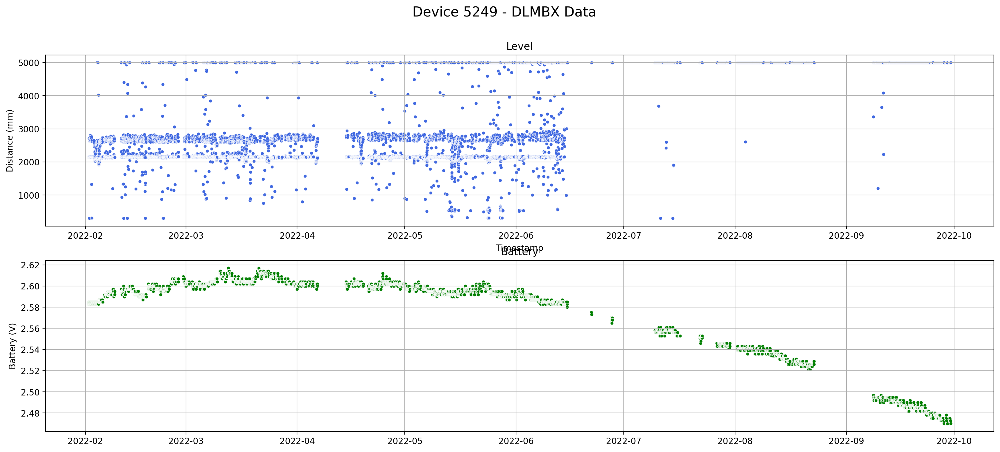

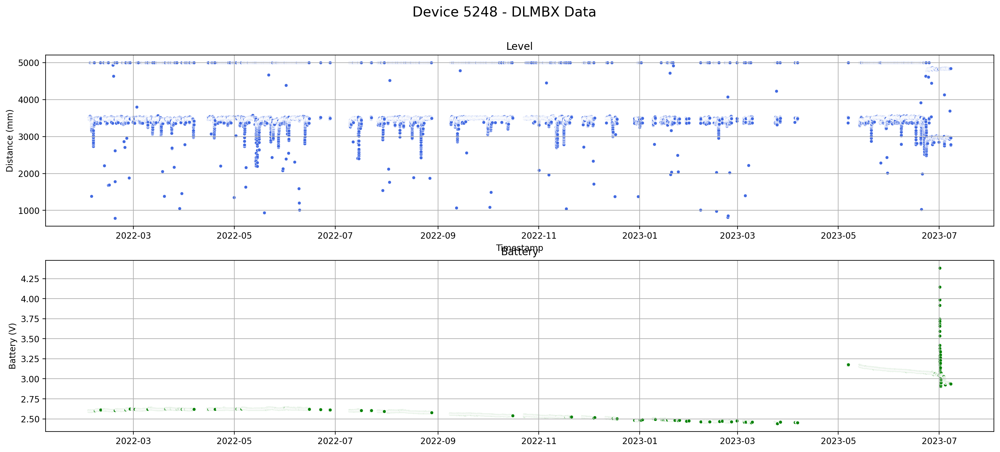

In [43]:
import os
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

path_data = r'C:\Users\sotarolabustos\Documents\Hazen\Projects\UVA Data\UVA_Link_Lab_Sensor_Data'
excel_path = os.path.join(path_data, 'DLMBX_timeseries_by_device.xlsx')
path_output = r'C:\Users\sotarolabustos\Documents\Hazen\Projects\UVA Data\UVA_Link_Lab_Sensor_Data\figures'

# Read all sheet names (device_ids)
xls = pd.ExcelFile(excel_path)
device_ids = xls.sheet_names

for device_id in device_ids:
    df = pd.read_excel(excel_path, sheet_name=device_id)
    df['received_at'] = pd.to_datetime(df['received_at'])
    plt.figure(figsize=(20, 8), dpi=200)
    
    # Level
    plt.subplot(2, 1, 1)
    sns.scatterplot(data=df, x='received_at', y='distance.value', color='royalblue', s=15)
    plt.title('Level')
    plt.ylabel('Distance (mm)')
    plt.xlabel('Timestamp')
    plt.grid(True)
    
    # Battery
    plt.subplot(2, 1, 2)
    sns.scatterplot(data=df, x='received_at', y='battery_voltage.value', color='green', s=15)
    plt.title('Battery')
    plt.ylabel('Battery (V)')
    plt.xlabel('')
    plt.grid(True)
    
    
    plt.suptitle(f'Device {device_id} - DLMBX Data', fontsize=16)
    plt.savefig(os.path.join(path_output, f'DLMBX_{device_id}_timeseries.png'), dpi=200)
    plt.show()